# Semi-supervised surgery pipeline with SCANVI

In [2]:
import os
task_cpus = '10'
os.environ["OPENBLAS_NUM_THREADS"] = task_cpus
os.environ["OMP_NUM_THREADS"] = task_cpus
os.environ["MKL_NUM_THREADS"] = task_cpus
os.environ["OMP_NUM_cpus"] = task_cpus
os.environ["MKL_NUM_cpus"] = task_cpus
os.environ["OPENBLAS_NUM_cpus"] = task_cpus

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import torch
import scanpy as sc
import scarches as sca
import scvi

# scvi.settings.dl_num_workers = 30

 captum (see https://github.com/pytorch/captum).


In [3]:
torch.cuda.is_available()

True

In [4]:
def plot_training_history(history, keys):
    """
    Plots the training history for the specified keys in a grid layout.
    
    Parameters:
    - history: dict, containing the training history.
    - keys: list of str, the keys to plot from the history.
    """
    num_plots = len(keys)
    grid_size = int(np.ceil(np.sqrt(num_plots)))

    fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))
    axes = axes.flatten()

    for idx, key in enumerate(keys):
        if key in history:
            axes[idx].plot(history[key])
            axes[idx].set_title(key)
        else:
            axes[idx].set_title(f"{key} not found")
        axes[idx].grid(True)

    for idx in range(num_plots, len(axes)):
        fig.delaxes(axes[idx])

    plt.tight_layout()
    plt.show()

In [5]:
sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(4, 4))
# TODO maybe this is what achieved high accuracy>
torch.set_float32_matmul_precision("high")
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

### IMPORTANT THIS IS WHERE WE CHOOSE THE CELL TYPE LABEL TO TRAIN ON AND THE DIRS TO SAVE AND LOAD DATA

In [6]:
condition_key = 'dataset2'
cell_type_key = 'cell_type_tumor'
data_dir = '/root/datos/maestria/netopaas/luca/data/atlas'
backup_dir = '/root/datos/maestria/netopaas/lung_scRNA/LUCA_model'

## Set relevant anndata.obs labels and training length

In [ ]:
import gc
adata = sc.read_h5ad('/root/datos/maestria/netopaas/luca/data/atlas/extended.h5ad')

adata = adata[(adata.obs.origin == 'tumor_primary')]

# stages = ['III','III or IV', 'IV']
stages = ['I','II','III','III or IV', 'IV']
adata = adata[adata.obs.uicc_stage.isin(stages)]

# we remove these because some are enriched for endotheliar and some for immune cells
studies = ['Goveia_Carmeliet_2020','Leader_Merad_2021','Guo_Zhang_2018']
adata = adata[~adata.obs.study.isin(studies)]
adata.obs[condition_key] = [ dset if dset != 'Wu_Zhou_2021' else adata.obs['sample'][i] for i, dset in enumerate(adata.obs['dataset'])]

del adata.layers['counts_length_scaled']
adata.X = adata.layers['count'].copy()
del adata.layers['count']
del adata.raw
gc.collect()

# We round the data as they are supposed to be counts
adata.X.data = np.round(adata.X.data)
adata

import numba
numba.set_num_threads(10)

df_hvg = sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=6000, batch_key='dataset', inplace=False)

adata.var['is_highly_variable'] = adata.var['is_highly_variable'].astype(str).eq('True')
adata.var.loc[df_hvg['highly_variable'], 'is_highly_variable'].astype(bool).sum()

In [44]:
# adata = sc.read_h5ad(f'{data_dir}/extended_tumor_hvg_wuSep.h5ad')
adata.write_h5ad(f'{data_dir}/extended_tumor_hvg_wuSep.h5ad')

In [ ]:
adata = adata[:, df_hvg['highly_variable']].copy()
source_adata = adata

## Create SCANVI model and train it on fully labelled reference dataset

In [47]:
# Does scVI
sca.models.SCVI.setup_anndata(source_adata, labels_key=cell_type_key,
                             batch_key=condition_key # HCLA atlas did not correct for sample,
                              # as they wanted to maintain variability
                             )

In [48]:
source_adata.obs[condition_key].unique()

['Chen_Zhang_2020', 'Kim_Lee_2020', 'He_Fan_2021', 'Lambrechts_Thienpont_2018_6149v1', 'Lambrechts_Thienpont_2018_6149v2', ..., 'Wu_Zhou_2021_GSM4453582', 'Wu_Zhou_2021_GSM4453595', 'Wu_Zhou_2021_GSM4453602', 'Zilionis_Klein_2019', 'UKIM-V-2']
Length: 53
Categories (53, object): ['Chen_Zhang_2020', 'He_Fan_2021', 'Kim_Lee_2020', 'Lambrechts_Thienpont_2018_6149v1', ..., 'Wu_Zhou_2021_GSM4453615', 'Wu_Zhou_2021_GSM4453616', 'Wu_Zhou_2021_GSM4453617', 'Zilionis_Klein_2019']

In [10]:
source_adata.obs

,sample,uicc_stage,ever_smoker,age,donor_id,origin,dataset,ann_fine,cell_type_predicted,doublet_status,...,disease,organism,sex,tissue,self_reported_ethnicity,development_stage,observation_joinid,dataset2,_scvi_batch,_scvi_labels
AAACCCAAGAGCCATG-1_0-1,Chen_Zhang_2020_NSCLC-10,III,NaN,NaN,Chen_Zhang_2020_NSCLC-10,tumor_primary,Chen_Zhang_2020,T cell CD8 effector memory,T cell CD8,singlet,...,non-small cell lung carcinoma,Homo sapiens,male,lung,unknown,unknown,bgE9FM<wVD,Chen_Zhang_2020,0,32
AAACCCAAGATTAGAC-1_0-1,Chen_Zhang_2020_NSCLC-10,III,NaN,NaN,Chen_Zhang_2020_NSCLC-10,tumor_primary,Chen_Zhang_2020,Cancer cells,Epithelial cell malignant,singlet,...,non-small cell lung carcinoma,Homo sapiens,male,lung,unknown,unknown,JM(E_OK4-8,Chen_Zhang_2020,0,37
AAACCCAAGGTCGCCT-1_0-1,Chen_Zhang_2020_NSCLC-10,III,NaN,NaN,Chen_Zhang_2020_NSCLC-10,tumor_primary,Chen_Zhang_2020,B cell,B cell,singlet,...,non-small cell lung carcinoma,Homo sapiens,male,lung,unknown,unknown,`Pg;`Co(CV,Chen_Zhang_2020,0,2
AAACCCAAGTCATTGC-1_0-1,Chen_Zhang_2020_NSCLC-10,III,NaN,NaN,Chen_Zhang_2020_NSCLC-10,tumor_primary,Chen_Zhang_2020,B cell,B cell,singlet,...,non-small cell lung carcinoma,Homo sapiens,male,lung,unknown,unknown,bmUWpje(CT,Chen_Zhang_2020,0,2
AAACCCACACGGATCC-1_0-1,Chen_Zhang_2020_NSCLC-10,III,NaN,NaN,Chen_Zhang_2020_NSCLC-10,tumor_primary,Chen_Zhang_2020,Plasma cell,Plasma cell,singlet,...,non-small cell lung carcinoma,Homo sapiens,male,lung,unknown,unknown,eCKfW>mBo$,Chen_Zhang_2020,0,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
811511_27-3,UKIM-V-2_P17_tumor_primary,I,yes,60.0,UKIM-V-2_P17,tumor_primary,UKIM-V-2,Neutrophils,NaN,singlet,...,squamous cell lung carcinoma,Homo sapiens,female,lung,unknown,60-year-old human stage,3(g6vJNO@o,UKIM-V-2,9,22
468397_27-3,UKIM-V-2_P17_tumor_primary,I,yes,60.0,UKIM-V-2_P17,tumor_primary,UKIM-V-2,Neutrophils,NaN,singlet,...,squamous cell lung carcinoma,Homo sapiens,female,lung,unknown,60-year-old human stage,jR%lZ``FtE,UKIM-V-2,9,22
115884_27-3,UKIM-V-2_P17_tumor_primary,I,yes,60.0,UKIM-V-2_P17,tumor_primary,UKIM-V-2,Neutrophils,NaN,singlet,...,squamous cell lung carcinoma,Homo sapiens,female,lung,unknown,60-year-old human stage,HsX>>5FRv|,UKIM-V-2,9,22
201201_27-3,UKIM-V-2_P17_tumor_primary,I,yes,60.0,UKIM-V-2_P17,tumor_primary,UKIM-V-2,Neutrophils,NaN,singlet,...,squamous cell lung carcinoma,Homo sapiens,female,lung,unknown,60-year-old human stage,BV1<+6rUgg,UKIM-V-2,9,22


### b128_lay4_h1024_wuSep

#### Load SCVI

In [53]:
ref_path = f'{backup_dir}/hvg_integrated_scvi_tumor_model_b128_lay4_h1024_wuSep/'
vae = sca.models.SCVI.load(ref_path, source_adata)

INFO     File                                                                                                      
         /root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_tumor_model_b128_lay4_h1024_wuSep/
         model.pt already downloaded                                                                               


/usr/local/lib/python3.11/site-packages/scvi/model/base/_save_load.py:71: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=map_locat

#### Train SCVI

In [55]:
# elbo_trai is btter for converging and elbo is better for generalization.
# I would suggest, elbo_train for scVi and elbo for scANVI
early_stopping_kwargs = {
    "early_stopping_monitor": "elbo_validation",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.1,
}
# This very importanto for actual covnergence... we have seen we tend to hit local minima and this helps in avoiding but only once...  a peridic approach would ve good
plan_kwargs= {
# "weight_decay": 0.0,
    "reduce_lr_on_plateau": True,
    "lr_patience": 8,
    "lr_factor": 0.05,
}

vae = sca.models.SCVI(
    source_adata,
    n_layers=4,
    n_latent=10,
    n_hidden=1024,
    gene_likelihood='nb',  # Nb maybe may have less false postiives, because zinb zeros are complete technical zeroes which are not very realistic
    dispersion='gene-batch', # We expect that the genes will have different dispersions in different batches
    # use_layer_norm="both", # Reduces instability, in the encoder ad decoder phase, this is important because we could get zeroes
    use_batch_norm="both", # Reduces instability, in the encoder ad decoder phase, this is important because we could get zeroes
    encode_covariates=True, # This is essential considering batch effects. If not used in the surgery it will not be able to correct for batch effects
    deeply_inject_covariates=False,  # Have more correlations between covariates, to make it more complex. Only has an effect in cell types, for batch_key it's the same as above
)

In [56]:
scvi.settings.dl_num_workers = 8

# this levaes with litlle epochs and that does not achieve good accuracy
vae.train(max_epochs=100, early_stopping=True, **early_stopping_kwargs, plan_kwargs=plan_kwargs, batch_size=128)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/usr/local/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 56/100:  56%|██████████████████████████████████████████████████████▉                                           | 56/100 [1:05:54<51:47, 70.62s/it, v_num=1, train_loss_step=1.01e+3, train_loss_epoch=1.4e+3]
Monitored metric elbo_validation did not improve in the last 10 records. Best score: 1450.364. Signaling Trainer to stop.


In [58]:
ref_path = f'{backup_dir}/hvg_integrated_scvi_tumor_model_b128_lay4_h1024_wuSep/'
vae.save(ref_path, overwrite=True)

#### SCVI history

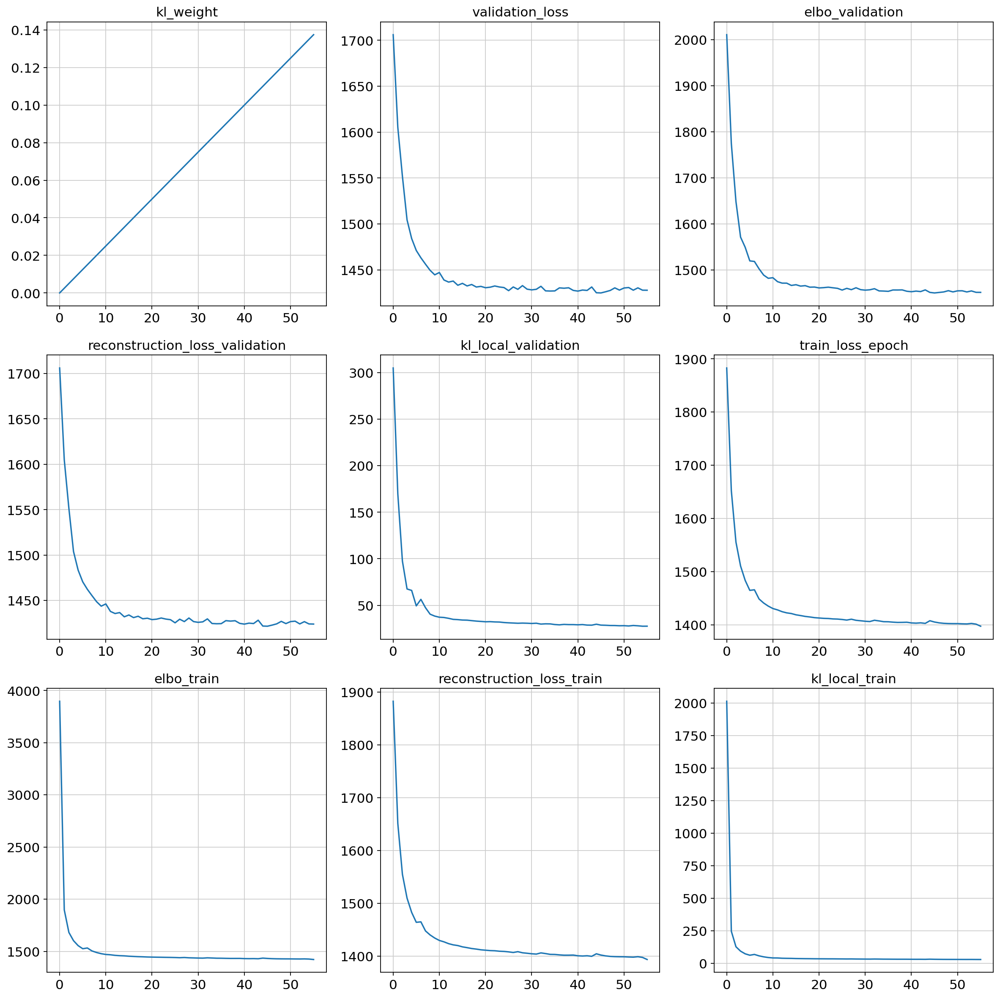

In [57]:
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(vae.history, history_keys)

#### SCANVI

In [59]:
# The soft activation may be used when the model reaches nans in training, but it is mucho slower.
scanvae = sca.models.SCANVI.from_scvi_model(vae, unlabeled_category = "Unknown",
    # var_activation=torch.nn.functional.softplus
    )

In [100]:
from lightning.pytorch.callbacks import Callback
import torch

class GradientNormCallback(Callback):
    def __init__(self, n=1):
        self.n = n
        self.counter = 0

    def on_after_backward(self, trainer, pl_module):
        """
        Called after each backward pass.
        We compute the total gradient norm across all parameters.
        """
        self.counter += 1
        if self.counter % self.n == 0:
            total_norm = 0.0
            for p in pl_module.parameters():
                if p.grad is not None:
                    param_norm = p.grad.data.norm(2).item()
                    total_norm += param_norm ** 2
            total_norm = total_norm ** 0.5
            
            # You can log it via Lightning's self.log or trainer.loggers,
            # or just print it here for demonstration:
            print(f"Gradient norm (L2): {total_norm:.4f}")

callback = GradientNormCallback()

In [60]:
import scvi
scvi.settings.dl_num_workers = 8  # is mostly used for data loading
early_stopping_kwargs = {
    "early_stopping_monitor": "elbo_validation",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.7,
}
# # This very importanto for actual covnergence... we have seen we tend to hit local minima and this helps i navoiding but only once...  a peridic approach would ve good
plan_kwargs= {
    # "weight_decay": 0.0,
    "reduce_lr_on_plateau": True,
    "lr_patience": 8,
    "lr_factor": 0.1,
    'lr': 1e-4,  # May be used when Nans are reached, very early in training
}

scanvae.train(max_epochs=300, early_stopping=True, **early_stopping_kwargs, plan_kwargs=plan_kwargs, batch_size=128, 
        # callbacks= [callback],   # We programmed a callback to return us the gradient norm, you can inspire yourself to report on anyithing else
        # gradient_clip_val=5.0,   # This is used to avoid exploding gradients
    )

INFO     Training for 300 epochs.                                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=79` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=79` in the `DataLoader` to improve performance.


Epoch 45/300:  15%|██████████████                                                                                | 45/300 [5:13:57<29:39:03, 418.60s/it, v_num=1, train_loss_step=1.42e+4, train_loss_epoch=1.4e+3]
Monitored metric elbo_validation did not improve in the last 10 records. Best score: 1422.116. Signaling Trainer to stop.


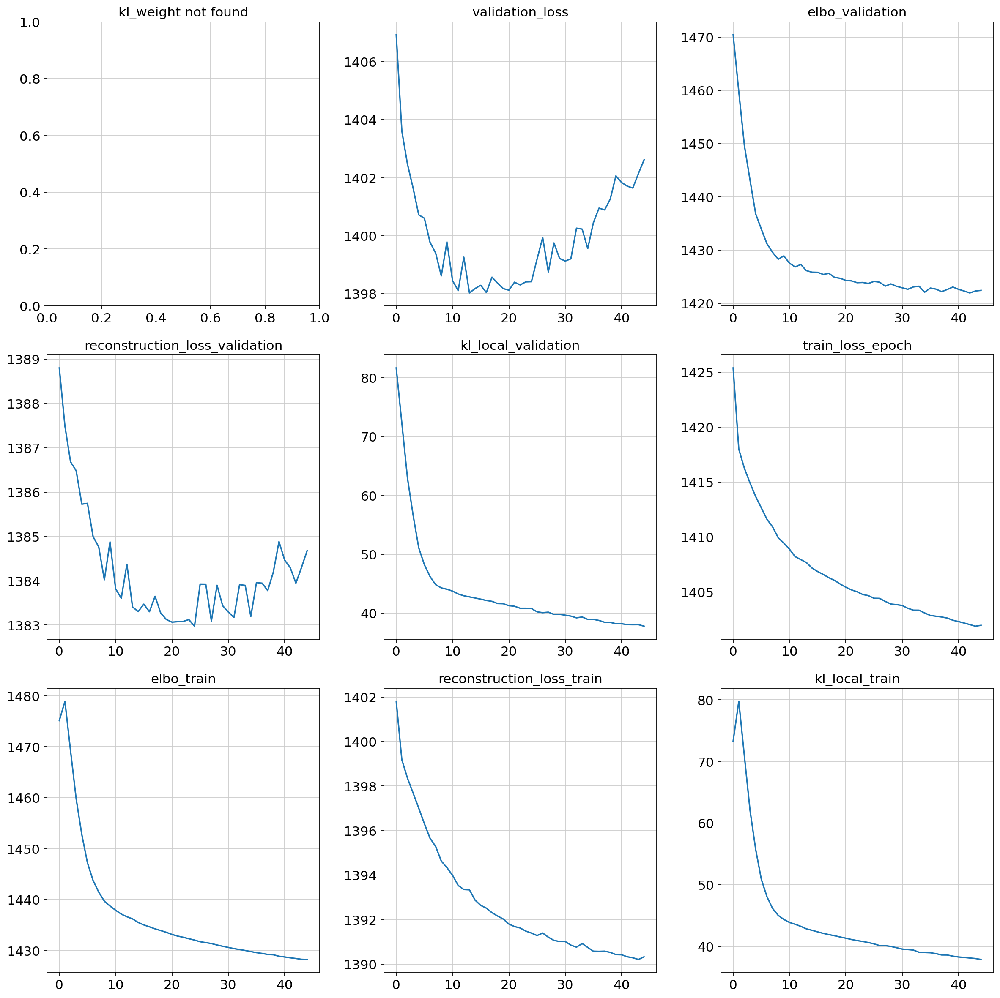

In [61]:
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(scanvae.history, history_keys)

In [62]:
reference_latent = sc.AnnData(scanvae.get_latent_representation())
reference_latent.obs["cell_type"] = source_adata.obs[cell_type_key].tolist()
reference_latent.obs["batch"] = source_adata.obs[condition_key].tolist()

In [63]:
reference_latent.obs['predictions'] = scanvae.predict()
print("Acc: {}".format(np.mean(reference_latent.obs.predictions == reference_latent.obs.cell_type)))

Acc: 0.96462792511313


In [92]:
ref_path = f'{backup_dir}/hvg_integrated_scvi_scanvi_tumor_model_b128_lay4_h1024_wuSep/'
# scanvae.save(ref_path, overwrite=True)
scanvae = sca.models.SCANVI.load(ref_path, source_adata)

INFO     File                                                                                                      
         /root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_b128_lay4_h1024
         _wuSep/model.pt already downloaded                                                                        


/usr/local/lib/python3.11/site-packages/scvi/model/base/_save_load.py:71: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=map_locat

#### SCANVI 2nd run

In [ ]:
scanvae.train(max_epochs=300, early_stopping=early_stopping_kwargs, plan_kwargs=plan_kwargs, batch_size=128)

INFO     Training for 300 epochs.                                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck.

Epoch 97/300:  32%|█████████████████████████████▊                                                               | 96/300 [11:11:04<23:47:53, 419.97s/it, v_num=1, train_loss_step=1.45e+3, train_loss_epoch=1.4e+3]

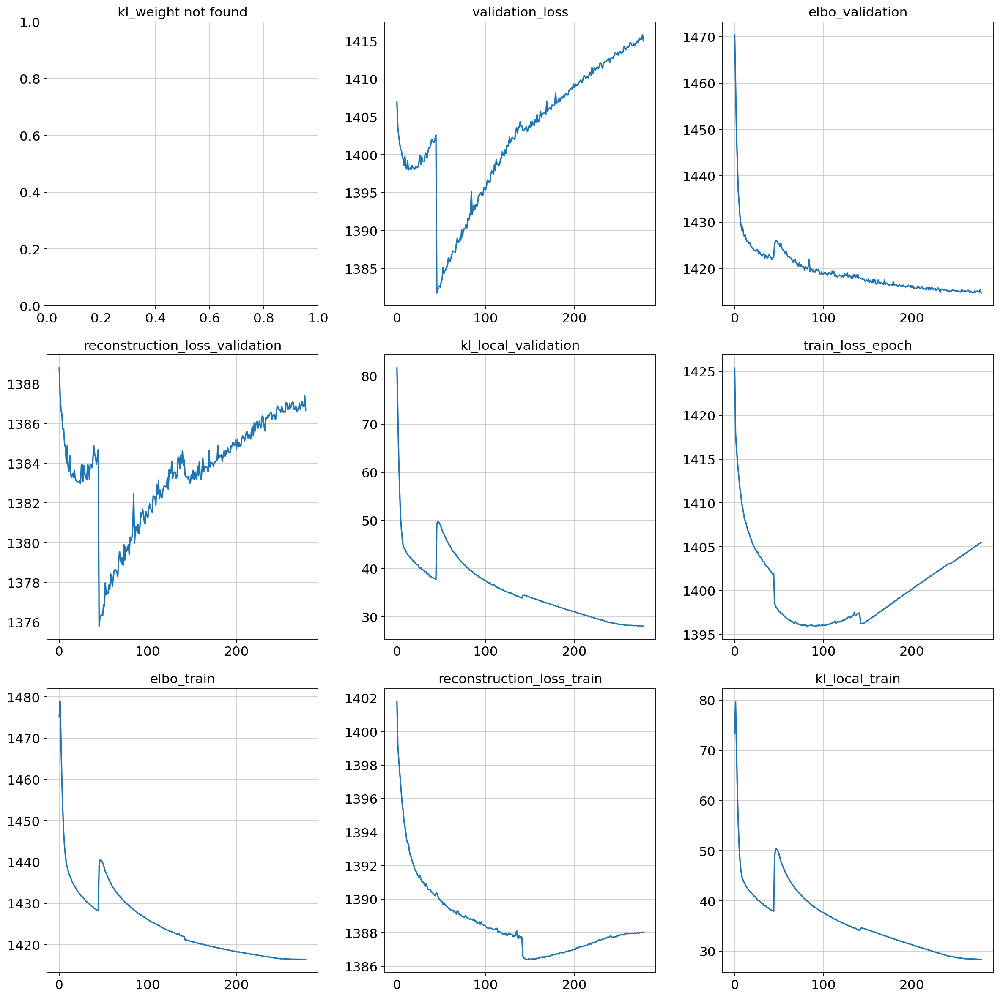

In [71]:
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(scanvae.history, history_keys)

In [93]:
reference_latent = sc.AnnData(scanvae.get_latent_representation())
reference_latent.obs["cell_type"] = source_adata.obs[cell_type_key].tolist()
reference_latent.obs["batch"] = source_adata.obs[condition_key].tolist()

In [94]:
reference_latent.obs['predictions'] = scanvae.predict()

In [96]:
# reference_latent.obs['predictions'] = scanvae.predict()
print("Acc: {}".format(np.mean(reference_latent.obs.predictions == reference_latent.obs.cell_type)))

Acc: 0.9941932375308593


**WuhuuuuuuuuuuuU!**

In [74]:
ref_path = f'{backup_dir}/hvg_integrated_scvi_scanvi_tumor_model_b128_lay4_h1024_wuSep_epocs300-300/'
scanvae.save(ref_path, overwrite=True)

In [70]:
reference_latent.write_h5ad(f'{ref_path}/ref_latent.h5ad')
# reference_latent = sc.read_h5ad(f'{ref_path}/ref_latent.h5ad')

## Save Latent Adata

In [8]:
# reference_latent.write_h5ad('{ref_path}/ref_latent.h5ad')
reference_latent = sc.read_h5ad(f'{ref_path}/ref_latent.h5ad')

Not that many neighbours because we are in embedded space

In [ ]:
import numba
numba.set_num_threads(30)
sc.pp.neighbors(reference_latent, n_neighbors=8)
sc.tl.leiden(reference_latent)
sc.tl.umap(reference_latent)

In [99]:
reference_latent.write_h5ad(f'{ref_path}/ref_latent.h5ad')
# reference_latent = sc.read_h5ad(f'{ref_path}/ref_latent.h5ad')

## Paint UMAP

In [100]:
reference_latent.obs['dataset'] = reference_latent.obs['batch'].map(lambda x: 'Wu_Zhou_2021' if 'Wu_Zhou_2021' in x else x)

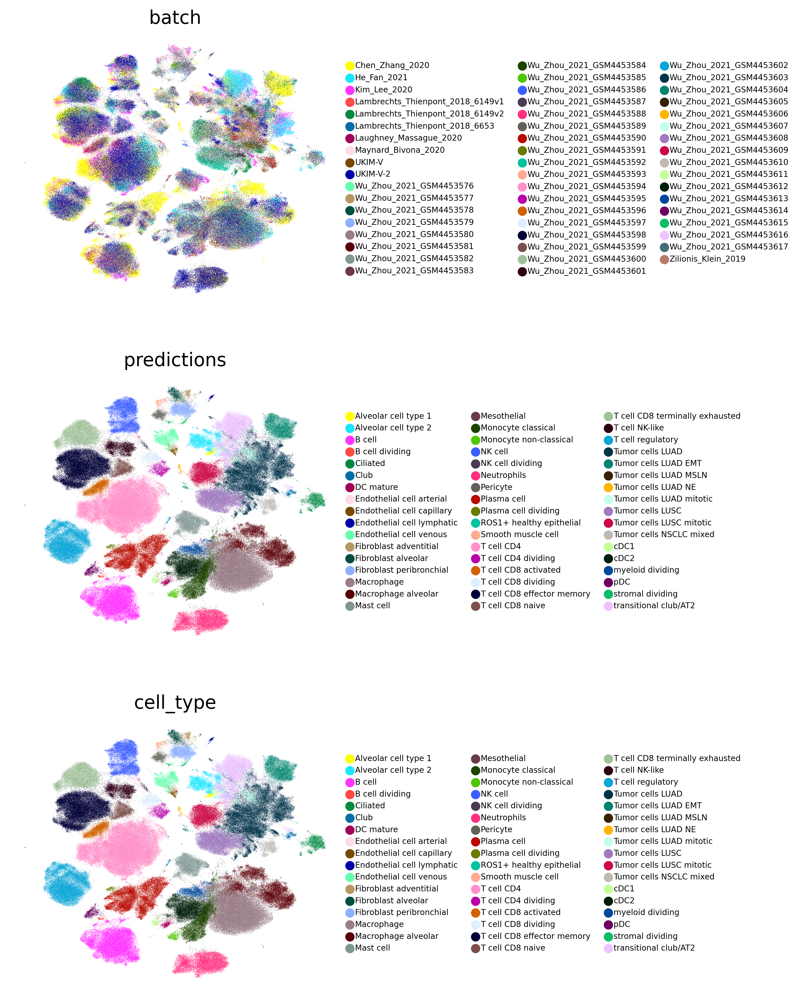

In [ ]:
sc.set_figure_params(dpi=200, frameon=False)
sc.pl.umap(reference_latent,
           color=['batch', 'predictions', 'cell_type'],
           frameon=False,
           ncols=1,
           legend_fontsize=6,
           )

Everything seems to look fine except that there are some tumor clusters that do not have mixture of other datasets in them.
The Tumor LUSC clusters, are mainly from the Wu_zho dataset that was analyzed with Singleron. Though there are some cells from Zillionis

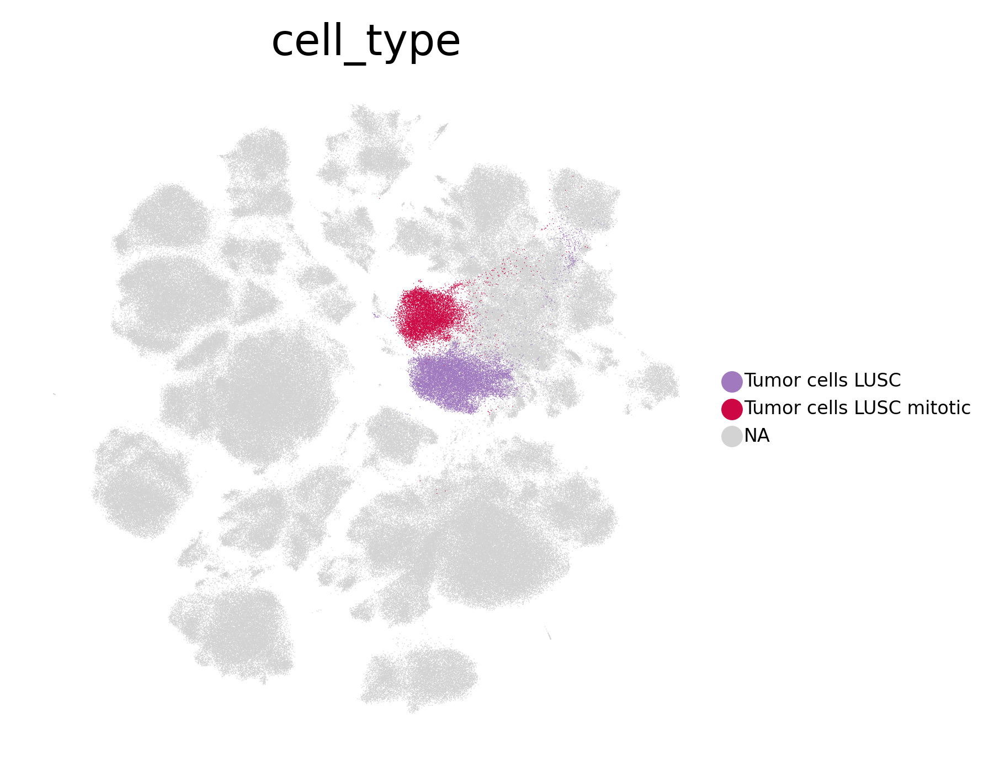

In [104]:
sc.set_figure_params(dpi=200, frameon=False)
sc.pl.umap(reference_latent,
           color=['cell_type'],
           frameon=False,
           ncols=1,
           legend_fontsize=6,
           groups=['Tumor cells LUSC', 'Tumor cells LUSC mitotic']
           )

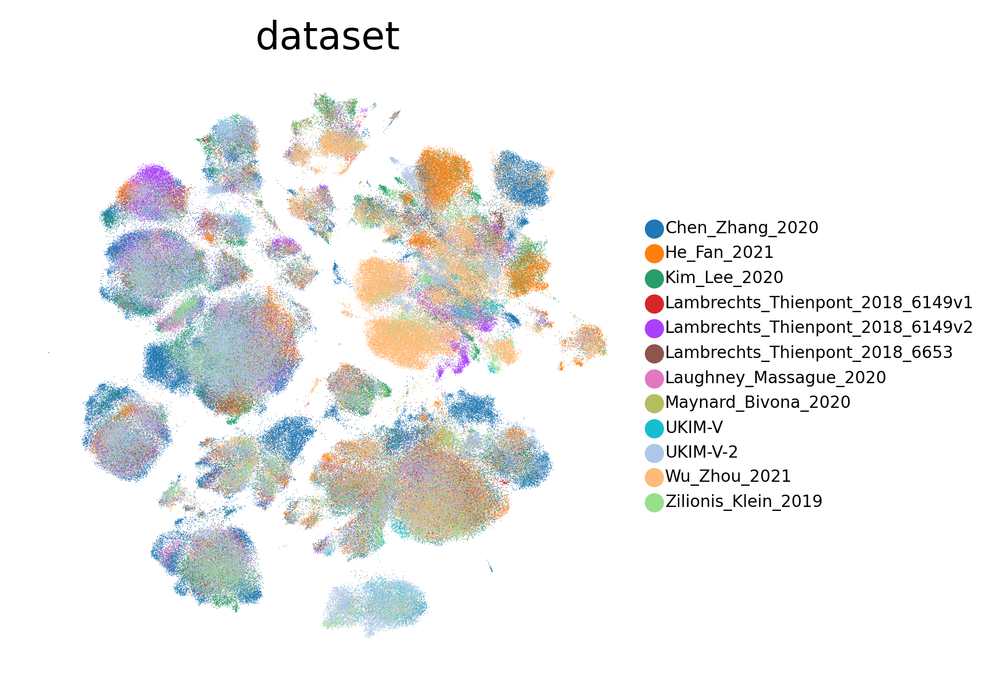

In [ ]:
sc.set_figure_params(dpi=200, frameon=False)
sc.pl.umap(reference_latent,
           color=['dataset'],
           frameon=False,
           ncols=1,
           legend_fontsize=6,
           )

Without the second ANVI run the tumor cellsstill separate themselves

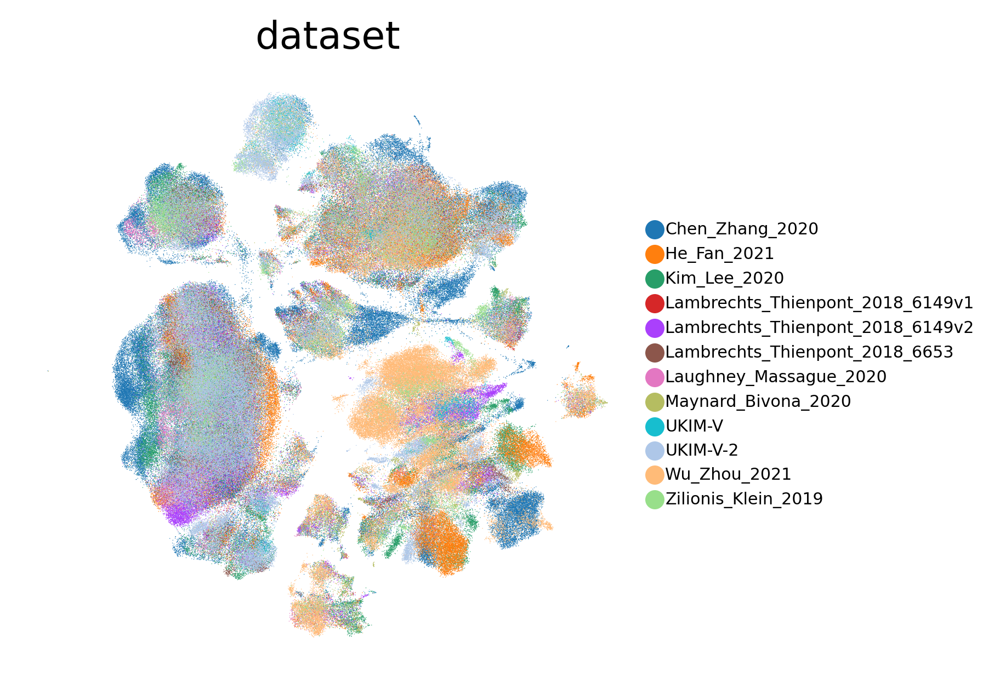

In [105]:
sc.set_figure_params(dpi=180, frameon=False)
sc.pl.umap(reference_latent2,
           color=['dataset'],
           frameon=False,
           ncols=1,
           legend_fontsize=6,
           )